In [1]:
!pip install mir_eval


[notice] A new release of pip is available: 24.2 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
import os
import numpy as np
import copy
from matplotlib import pyplot as plt
import librosa
from scipy.signal import medfilt as medfilt
from scipy.ndimage import maximum_filter1d as maxfilt
import sys
import IPython.display as ipd

In [ ]:
def rms_odf(filename, windowTime, hopTime):
    
    snd, rate = librosa.load(filename, sr=None)
    hop = round(rate * hopTime)
    # round up to next power of 2
    wlen = int(2 ** np.ceil(np.log2(rate * windowTime)))
    # centre frames: first frame at t=0
    snd = np.concatenate([np.zeros(wlen//2), snd, np.zeros(wlen//2)])
    frameCount = int(np.floor((len(snd) - wlen) / hop + 1))
    odf = np.zeros(frameCount)
    window = np.hamming(wlen)
    for i in range(frameCount):
        start = i * hop
        frame = np.fft.fft(snd[start: start+wlen] * window)
        odf[i] = np.sqrt(np.mean(np.power(np.abs(frame), 2)))
    mx = max(odf)
    if mx > 0:
        odf /= mx
    return odf

In [ ]:
def getOnsets(odf, hopTime, wd=3, thr=0):

    t = np.arange(len(odf)) * hopTime
    medFiltODF = odf - medfilt(odf, wd)
    maxFiltODF = maxfilt(medFiltODF, wd, mode='nearest', axis=0)
    threshold = [max(i, thr) for i in maxFiltODF]
    peakIndices = np.nonzero(np.greater_equal(medFiltODF, threshold))
    peakTimes = peakIndices[0] * hopTime
    plt.figure(figsize=(14, 3))
    plt.xlabel('Time (s)')
    plt.ylabel('RMS ODF')
    plt.plot(t, medFiltODF, 'c')
    plt.plot(t, threshold, 'y')
    return peakTimes

In [5]:
def relationship_factor(interval_ratio):
    weight = (6 - interval_ratio) if 1 <= interval_ratio <= 4 else (1 if 5 <= interval_ratio <= 8 else 0)
    return weight

In [ ]:
def cluster_iois(onsets, cluster_width):
    
    clusters = []
    for onseti in range(len(onsets)):
        for onsetj in range(onseti + 1, len(onsets)):
            ioi = abs(onsets[onsetj] - onsets[onseti])
            ioi = float(ioi)
            best_cluster = None
            best_diff = float('inf')
            for cluster in clusters:
                diff = abs(cluster["mean"] - ioi)
                if diff < best_diff:
                    best_diff = diff
                    best_cluster = cluster
            if best_cluster is not None and best_diff < cluster_width:
                best_cluster["intervals"].append(ioi)
                best_cluster["mean"] = float(np.mean(best_cluster["intervals"]))
            else:
                clusters.append({"intervals": [ioi], "mean": float(ioi)})
    i = 0
    while i < len(clusters):
        j = i + 1
        while j < len(clusters):
            if abs(clusters[i]["mean"] - clusters[j]["mean"]) < cluster_width:
                clusters[i]["intervals"].extend(clusters[j]["intervals"])
                clusters[i]["mean"] = float(np.mean(clusters[i]["intervals"]))
                clusters.pop(j)
            else:
                j += 1
        i += 1
    for cluster in clusters:
        cluster["score"] = 0
    for cluster1 in clusters:
        for cluster2 in clusters:
            for n in range(1, 9):
                if abs(cluster1["mean"] - n * cluster2["mean"]) < cluster_width:
                    cluster1["score"] += relationship_factor(n) * len(cluster2["intervals"])
    return clusters

In [ ]:
def merging_clusters(clusters, cluster_width):
    i = 0
    while i < len(clusters):
        j = i + 1
        while j < len(clusters):
            if abs(clusters[i]["mean"] - clusters[j]["mean"]) < cluster_width:
                clusters[i]["intervals"].extend(clusters[j]["intervals"])
                clusters[i]["mean"] = float(np.mean(clusters[i]["intervals"]))
                clusters.pop(j)
            else:
                j += 1
        i += 1
    return clusters

def tempo_filtering(clusters):
    i = 0
    while i < len(clusters):
        if clusters[i]["mean"] < 0.26 or clusters[i]["mean"] > 2.4:
            clusters.pop(i)
        else:
            i += 1
    return clusters

class Agent:
    def __init__(self, tempo, phase, history, score):
    
        self.tempo = float(tempo)
        self.phase = float(phase)
        self.history = [float(t) for t in history]
        self.score = float(score)

    def clone(self):
        
        return Agent(self.tempo, self.phase, copy.deepcopy(self.history), self.score)

def prune_duplicates(agents, tempo_thresh=0.01, phase_thresh=0.02):
    unique_agents = []
    for agent in agents:
        duplicate_found = False
        for u in unique_agents:
            if abs(agent.tempo - u.tempo) < tempo_thresh and abs(agent.phase - u.phase) < phase_thresh:
                if agent.score > u.score:
                    unique_agents.remove(u)
                    unique_agents.append(agent)
                duplicate_found = True
                break
        if not duplicate_found:
            unique_agents.append(agent)
    return unique_agents

In [ ]:
def beat_tracking(events, tempo_clusters, startup_period=10.0, correction_factor=0.5):
    
    agents = []
    for cluster in tempo_clusters:
        for tempo in cluster["intervals"]:
            for event in events:
                if event["time"] <= startup_period:
                    agents.append(Agent(float(tempo), float(event["time"]), [float(event["time"])], float(event["salience"])))
                else:
                    break

    for event in events:
        if event["time"] <= startup_period:
            continue
        new_agents = []
        for agent in agents:
            while event["time"] - agent.phase > agent.tempo * 1.15:
                interp_time = agent.phase + agent.tempo
                agent.history.append(float(interp_time))
                agent.phase = float(interp_time)
            n = round((event["time"] - agent.phase) / agent.tempo)
            predicted_time = agent.phase + n * agent.tempo
            Tol_inner = 0.04
            Tol_pre = 0.25 * agent.tempo
            Tol_post = 0.15 * agent.tempo
            error = event["time"] - predicted_time
            if abs(error) <= Tol_inner:
                relativeError = abs(error) / Tol_inner
                agent.phase = float(event["time"])
                agent.tempo = float(agent.tempo + correction_factor * error)
                agent.history.append(float(event["time"]))
                agent.score += float(event["salience"] * (1 - 0.5 * relativeError))
            elif (-Tol_pre <= error < -Tol_inner) or (Tol_inner < error <= Tol_post):
                relativeError = abs(error) / (Tol_pre if error < 0 else Tol_post)
                alternative_agent = agent.clone()
                agent.phase = float(event["time"])
                agent.tempo = float(agent.tempo + correction_factor * error)
                agent.history.append(float(event["time"]))
                agent.score += float(event["salience"] * (1 - relativeError))
                new_agents.append(alternative_agent)
            new_agents.append(agent)
        agents = prune_duplicates(new_agents, tempo_thresh=0.01, phase_thresh=0.02)
        max_agents = 10  # Limit the number of agents to prevent explosion.
        if len(agents) > max_agents:
            agents = sorted(agents, key=lambda a: a.score, reverse=True)[:max_agents]
    best_agent = max(agents, key=lambda a: a.score)
    return best_agent.history, best_agent.score

In [ ]:
def save_beats_to_file(beats, output_filename="detected_beats.txt"):
    
    beats = np.sort(np.array(beats, dtype=np.float64))  # Ensure sorted 1D array
    np.savetxt(output_filename, beats, fmt="%.6f")  # Saves with 6 decimal places
    print(f"Beats saved to {output_filename} in correct format.")

In [10]:
def beatTracker(inputFile):
    windowSize = 0.03
    hopSize = 0.01
    filterWidth = 5
    threshold = 0.03

    odf = rms_odf(inputFile, windowSize, hopSize)
    estimatedOnsets = getOnsets(odf, hopSize, filterWidth, threshold)
    print(estimatedOnsets)
    print('Input file: ' + inputFile)
    plt.title('Onsets found for file: ' + inputFile)
    for j in estimatedOnsets:
        plt.axvline(j, ymax=0.5, color='k')
    ipd.display(ipd.Audio(inputFile))

    clusters = cluster_iois(estimatedOnsets, 0.2)
    merged_clusters = merging_clusters(clusters, 0.2)
    filtered_clusters = tempo_filtering(merged_clusters)
    print(filtered_clusters)

    events_with_salience = []
    for onset in estimatedOnsets:
        frame_idx = int(round(onset / hopSize))
        salience = odf[frame_idx]
        events_with_salience.append({"time": float(onset), "salience": float(salience)})

    # beats = beat_tracking(events_with_salience, filtered_clusters, startup_period=5.0, correction_factor=0.5)
    # beats_txt = save_beats_to_file(beats)

    beats, _ = beat_tracking(events_with_salience, filtered_clusters, startup_period=5.0, correction_factor=0.5)

    return beats

In [11]:
base_path = "C:/Users/yiann/Downloads/Results/BallroomData"

In [12]:
import mir_eval

Processing subfolder: C:/Users/yiann/Downloads/Results/BallroomData\ChaChaCha
[ 0.08  0.31  1.73  2.    2.69  3.19  3.66  4.86  5.55  5.81  6.15  6.28
  6.32  6.53  6.62  6.66  6.77  6.82  6.87  7.01  7.06  7.23  7.47  7.82
  7.95  8.11  8.16  8.42  8.51  8.55  8.66  8.8   8.9   9.02  9.18  9.37
  9.62  9.91 10.11 10.33 10.57 10.81 11.03 11.28 11.53 11.77 11.89 12.23
 12.31 12.34 12.48 12.72 12.99 13.15 13.19 13.43 13.52 13.69 13.75 14.02
 14.14 14.39 14.48 14.64 14.87 15.11 15.45 15.58 15.62 16.05 16.24 16.3
 16.4  16.54 17.01 17.25 17.3  17.35 17.51 17.56 17.96 18.21 18.45 18.92
 19.17 19.4  19.66 19.87 19.95 20.04 20.12 20.16 20.36 20.46 20.54 20.76
 20.82 21.07 21.31 21.78 22.02 22.18 22.26 22.5  22.65 22.74 22.82 22.98
 23.22 23.69 23.94 24.41 24.64 24.9  24.94 24.99 25.13 25.4  25.6  25.85
 26.1  26.56 27.04 27.51 27.75 28.95]
Input file: C:/Users/yiann/Downloads/Results/BallroomData\ChaChaCha\Albums-Cafe_Paradiso-05.wav


[{'intervals': [1.65, 1.69, 1.6600000000000001, 1.6700000000000004, 1.67, 1.7599999999999998, 1.6800000000000006, 1.6599999999999993, 1.67, 1.7999999999999998, 1.67, 1.63, 1.7899999999999991, 1.5799999999999992, 1.63, 1.7999999999999998, 1.7599999999999998, 1.6499999999999995, 1.7399999999999993, 1.7800000000000002, 1.5999999999999996, 1.6899999999999995, 1.7300000000000004, 1.6399999999999997, 1.6800000000000006, 1.79, 1.6500000000000004, 1.790000000000001, 1.5999999999999996, 1.7400000000000002, 1.67, 1.7899999999999991, 1.71, 1.8000000000000007, 1.6700000000000008, 1.8000000000000007, 1.75, 1.6899999999999995, 1.5999999999999996, 1.7799999999999994, 1.67, 1.7699999999999996, 1.67, 1.790000000000001, 1.6300000000000008, 1.6599999999999984, 1.6599999999999984, 1.6199999999999992, 1.6600000000000001, 1.7800000000000011, 1.6600000000000001, 1.7400000000000002, 1.7699999999999996, 1.67, 1.6900000000000013, 1.7100000000000009, 1.620000000000001, 1.6600000000000001, 1.6600000000000001, 1.7

[{'intervals': [1.1500000000000004, 1.0500000000000003, 1.0100000000000002, 0.9699999999999998, 0.9700000000000006, 1.21, 0.9800000000000004, 1.0499999999999998, 0.9799999999999995, 1.2300000000000004, 0.9699999999999998, 1.2399999999999993, 0.9000000000000004, 1.17, 0.9699999999999998, 1.2100000000000009, 0.9800000000000004, 1.1899999999999995, 0.9799999999999995, 1.2299999999999986, 0.9699999999999989, 1.0199999999999996, 0.9700000000000006, 0.9800000000000004, 0.9299999999999997, 0.9800000000000004, 0.9700000000000006, 0.9800000000000004, 0.9800000000000004, 0.9699999999999989, 1.0, 0.9799999999999986, 1.1099999999999994, 0.9700000000000006, 0.9499999999999993, 1.0399999999999991, 0.9600000000000009, 0.9700000000000006, 1.0, 0.9100000000000001, 0.9900000000000002, 1.1199999999999992, 0.9799999999999986, 1.08, 0.9399999999999995, 1.0099999999999998, 0.9700000000000006, 1.08, 0.9700000000000006, 1.0100000000000016, 0.9400000000000013, 0.9800000000000004, 1.0599999999999987, 0.98999999

[{'intervals': [0.61, 0.67, 0.72, 0.58, 0.64, 0.69, 0.53, 0.5900000000000001, 0.64, 0.47, 0.53, 0.58, 0.42, 0.48000000000000004, 0.53, 0.51, 0.54, 0.44999999999999996, 0.48, 0.48, 0.54, 0.48999999999999977, 0.47999999999999954, 0.4800000000000004, 0.4800000000000004, 0.4899999999999993, 0.4900000000000002, 0.5199999999999996, 0.4800000000000004, 0.4800000000000004, 0.4800000000000004, 0.47999999999999954, 0.4900000000000002, 0.47000000000000064, 0.5300000000000011, 0.41999999999999993, 0.4800000000000004, 0.4800000000000004, 0.5399999999999991, 0.41999999999999993, 0.47999999999999865, 0.4599999999999991, 0.48999999999999844, 0.5499999999999989, 0.4299999999999997, 0.4900000000000002, 0.4900000000000002, 0.5, 0.5400000000000009, 0.4399999999999995, 0.4800000000000004, 0.47000000000000064, 0.5300000000000011, 0.4299999999999997, 0.4900000000000002, 0.5099999999999998, 0.4499999999999993, 0.4800000000000004, 0.4400000000000013, 0.46000000000000085, 0.5300000000000011, 0.5199999999999996,

[{'intervals': [0.46999999999999975, 0.4900000000000002, 0.4800000000000004, 0.47999999999999954, 0.4800000000000004, 0.4900000000000002, 0.47999999999999954, 0.4900000000000002, 0.54, 0.5899999999999999, 0.4800000000000004, 0.4300000000000006, 0.5199999999999996, 0.5499999999999989, 0.5999999999999996, 0.4599999999999991, 0.4299999999999997, 0.46000000000000085, 0.5, 0.5500000000000007, 0.4900000000000002, 0.45000000000000107, 0.40000000000000036, 0.5199999999999996, 0.5999999999999996, 0.47000000000000064, 0.4400000000000013, 0.5600000000000005, 0.4800000000000004, 0.4900000000000002, 0.5499999999999989, 0.6099999999999994, 0.41000000000000014, 0.4499999999999993, 0.4900000000000002, 0.5599999999999987, 0.46999999999999886, 0.4299999999999997, 0.3899999999999988, 0.5, 0.5300000000000011, 0.5800000000000001, 0.47000000000000064, 0.4399999999999995, 0.39000000000000057, 0.46000000000000085, 0.5400000000000009, 0.48999999999999844, 0.5999999999999996, 0.40999999999999837, 0.519999999999

[{'intervals': [0.47999999999999954, 0.5199999999999996, 0.4900000000000002, 0.5800000000000001, 0.4500000000000002, 0.54, 0.4899999999999993, 0.39999999999999947, 0.47000000000000064, 0.6000000000000014, 0.4900000000000002, 0.4900000000000002, 0.5500000000000007, 0.41999999999999993, 0.4900000000000002, 0.6099999999999994, 0.4900000000000002, 0.5199999999999996, 0.4800000000000004, 0.41999999999999993, 0.5599999999999987, 0.4399999999999995, 0.5, 0.41000000000000014, 0.47000000000000064, 0.5099999999999998, 0.5599999999999987, 0.5500000000000007, 0.4900000000000002, 0.4900000000000002, 0.4400000000000013, 0.4499999999999993, 0.5099999999999998, 0.3899999999999988, 0.4599999999999991, 0.5899999999999999, 0.3800000000000008, 0.5, 0.4399999999999995, 0.5600000000000005, 0.4900000000000002, 0.5600000000000005, 0.4299999999999997, 0.5499999999999989, 0.4299999999999997, 0.5, 0.6000000000000014, 0.4800000000000004, 0.6100000000000012, 0.41000000000000014, 0.5400000000000009, 0.4200000000000

ValueError: max() iterable argument is empty

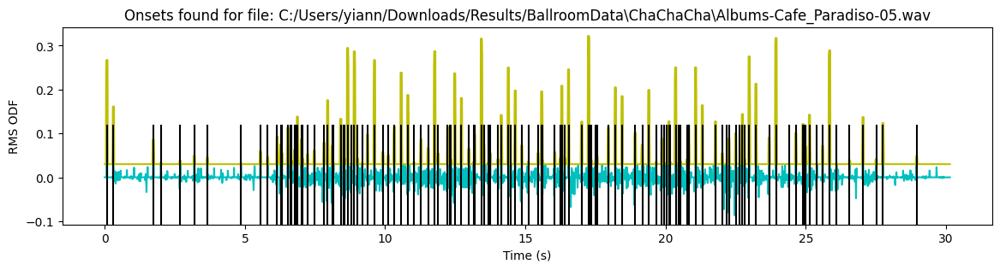

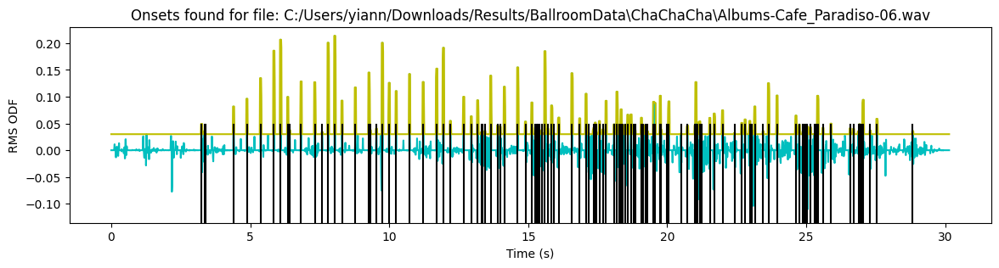

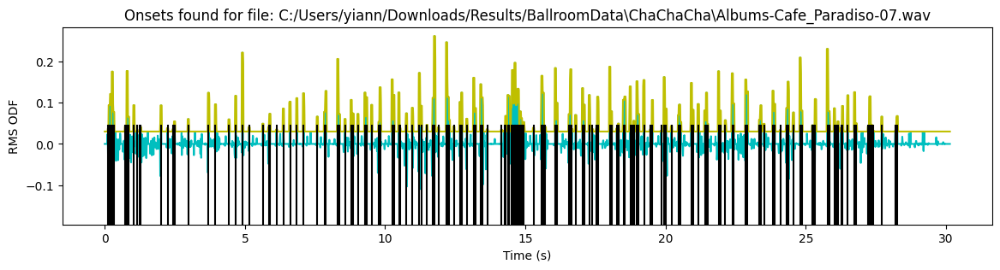

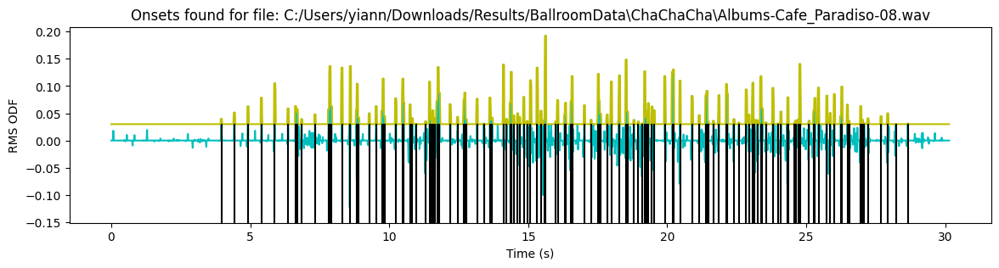

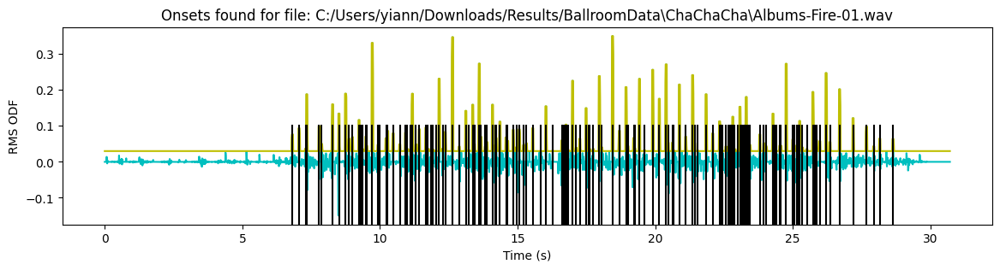

In [13]:
import os

for subdir, dirs, files in os.walk(base_path):
  if subdir != base_path:
    print(f"Processing subfolder: {subdir}")
    for file in files:
      if file.endswith(".wav"):
        filepath = os.path.join(subdir, file)
        beats = beatTracker(filepath)
        output_filename = os.path.join(subdir, "detected_beats_" + file[:-4] + ".txt")
        save_beats_to_file(beats, output_filename)

In [ ]:
import os
import numpy as np

base__beats_path = "C:/DriveSync/Queen_Mary/Modules/Music_Informatics/MI_coursework1/data1/BallroomAnnotations-master"

for filename in os.listdir(base__beats_path):
    if filename.endswith(".beats"):
        filepath = os.path.join(base__beats_path, filename)
        try:
            with open(filepath, 'r') as f:
                lines = f.readlines()

            # Process the file content (delete the second column)
            new_lines = []
            for line in lines:
                parts = line.strip().split()
                if len(parts) >= 2:
                    new_lines.append(parts[0] + "\n") # keep only the first column
                elif len(parts) == 1:
                    new_lines.append(parts[0] + "\n")

            # Save the modified content to a new file
            new_filename = filename.replace(".beats", "_rb.txt")
            new_filepath = os.path.join(base__beats_path, new_filename)
            with open(new_filepath, 'w') as outfile:
                outfile.writelines(new_lines)

            print(f"Processed file: {filename}, saved as {new_filename}")

        except Exception as e:
            print(f"Error processing file {filename}: {e}")


Processed file: Albums-Chrisanne3-13.beats, saved as Albums-Chrisanne3-13_rb.txt
Processed file: Media-105502.beats, saved as Media-105502_rb.txt
Processed file: Media-104210.beats, saved as Media-104210_rb.txt
Processed file: Albums-Latin_Jam5-06.beats, saved as Albums-Latin_Jam5-06_rb.txt
Processed file: Albums-Ballroom_Classics4-05.beats, saved as Albums-Ballroom_Classics4-05_rb.txt
Processed file: Albums-Latin_Jam-08.beats, saved as Albums-Latin_Jam-08_rb.txt
Processed file: Media-103817.beats, saved as Media-103817_rb.txt
Processed file: Media-103715.beats, saved as Media-103715_rb.txt
Processed file: Media-104916.beats, saved as Media-104916_rb.txt
Processed file: Albums-Chrisanne3-04.beats, saved as Albums-Chrisanne3-04_rb.txt
Processed file: Media-106115.beats, saved as Media-106115_rb.txt
Processed file: Media-103718.beats, saved as Media-103718_rb.txt
Processed file: Albums-AnaBelen_Veneo-01.beats, saved as Albums-AnaBelen_Veneo-01_rb.txt
Processed file: Media-105104.beats, s

In [ ]:
base_path = "C:/Users/yiann/Downloads/Results/BallroomData"

In [ ]:

import os
import mir_eval

base_path = "C:/Users/yiann/Downloads/Results/BallroomData"

for subdir, dirs, files in os.walk(base_path):
  if subdir != base_path:
    for file in files:
      if file.endswith(".wav"):
        wav_file_path = os.path.join(subdir, file)
        filename_no_ext = file[:-4]

       
        reference_file = os.path.join(base__beats_path, filename_no_ext + "_rb.txt")
        estimated_file = os.path.join(subdir, "detected_beats_" + filename_no_ext + ".txt")

        try:
          reference_beats = mir_eval.io.load_events(reference_file)
          estimated_beats = mir_eval.io.load_events(estimated_file)

          reference_beats = mir_eval.beat.trim_beats(reference_beats)
          estimated_beats = mir_eval.beat.trim_beats(estimated_beats)

          f_measure = mir_eval.beat.f_measure(reference_beats, estimated_beats)

          output_f_measure_file = os.path.join(subdir, filename_no_ext + "_f_measure.txt")
          with open(output_f_measure_file, "w") as f:
            f.write(str(f_measure))

          print(f"Processed {wav_file_path}, F-measure: {f_measure}, saved to {output_f_measure_file}")

        except FileNotFoundError:
          print(f"Error: Could not find either reference or estimated beats file for {wav_file_path}")
        except Exception as e:
          print(f"An error occurred while processing {wav_file_path}: {e}")


Processed /content/drive/MyDrive/00__Python/Y/BallroomData/Jive/Media-103515.wav, F-measure: 0.9172932330827067, saved to /content/drive/MyDrive/00__Python/Y/BallroomData/Jive/Media-103515_f_measure.txt
Processed /content/drive/MyDrive/00__Python/Y/BallroomData/Jive/Media-103517.wav, F-measure: 0.8391608391608392, saved to /content/drive/MyDrive/00__Python/Y/BallroomData/Jive/Media-103517_f_measure.txt
Processed /content/drive/MyDrive/00__Python/Y/BallroomData/Jive/Media-103611.wav, F-measure: 0.9295774647887323, saved to /content/drive/MyDrive/00__Python/Y/BallroomData/Jive/Media-103611_f_measure.txt
Processed /content/drive/MyDrive/00__Python/Y/BallroomData/Jive/Media-103516.wav, F-measure: 0.9420289855072465, saved to /content/drive/MyDrive/00__Python/Y/BallroomData/Jive/Media-103516_f_measure.txt
Processed /content/drive/MyDrive/00__Python/Y/BallroomData/Jive/Media-103613.wav, F-measure: 0.6496815286624203, saved to /content/drive/MyDrive/00__Python/Y/BallroomData/Jive/Media-103613